In [1]:
import pickle
import sys
from pathlib import Path

import cv2
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage.io
from matplotlib.colors import ListedColormap
from skimage import exposure, measure

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# Import path
module_path = str(Path.cwd().parents[0])
if module_path not in sys.path:
    sys.path.append(module_path)

from config import *

In [4]:
module_path = str(Path.cwd().parents[0] / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import utils as utils

In [5]:
csv_file = data_meta / "info_combined.csv"

# Read dataframe containing images information
df = pd.read_csv(csv_file)

In [6]:
# Get shift between cycle
cycles = df.Cycle.unique()
conditions = df.Location.unique()

# Get registration result

In [7]:
def create_transparent_cmap(cmap):
    # Get the colormap colors
    my_cmap = cmap(np.arange(cmap.N))

    # Set alpha
    my_cmap[:, -1] = np.linspace(0, 1, cmap.N)

    # Create new colormap
    my_cmap = ListedColormap(my_cmap)

    return my_cmap


def create_random_cmap():
    vals = np.linspace(0, 1, 256)
    #     np.random.shuffle(vals)
    cmap = plt.cm.colors.ListedColormap(plt.cm.jet(vals))
    return cmap

AttributeError: 'DataFrame' object has no attribute 'Z_stack'

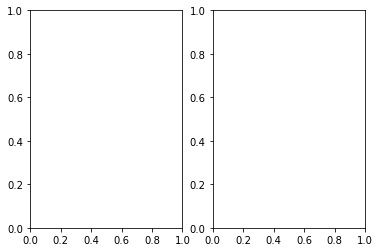

In [8]:
colors = [create_random_cmap() for _ in range(len(cycles))]
my_cmaps = [create_transparent_cmap(cmap) for cmap in colors]

for condition in conditions:
    df_subset = df[(df.Location == condition) & (df.Channel == "CH1")]

    fig, axs = plt.subplots(1, 2)
    for idx, cycle in enumerate(cycles):
        temp = df_subset[df_subset.Cycle == cycle]
        img_dapi = skimage.io.imread(temp[temp.Z_stack == "1"].Path.item())
        if len(img_dapi.shape) > 2:
            img_dapi = img_dapi[:, :, 0]
        img_dapi_corrected = skimage.io.imread(
            temp[temp.Z_stack == "1"].Path_corrected.item()
        )

        axs[0].imshow(img_dapi, cmap=my_cmaps[idx], alpha=0.8)
        axs[1].imshow(img_dapi_corrected, cmap=my_cmaps[idx], alpha=0.8)

    axs[0].axis("off")
    axs[1].axis("off")

    fig.set_size_inches(20, 40)
        fig.savefig(str(condition)+'.png', bbox_inches='tight', dpi=100)
    plt.show()

# Mask outline with numbering

In [11]:
imgs, conditions = utils.get_composite_image(df)

In [12]:
masks = utils.get_masks(data_mask)

In [13]:
# %matplotlib agg
# for idx, condition in enumerate(masks.keys()):
#     mask = masks[condition]["cyto"]
#     mask_nuclei = masks[condition]["nuclei"]

#     # Get contour of masks
#     contours = utils.get_contour(mask)
#     contours_nuclei = utils.get_contour(mask_nuclei)

#     # Get centroid of mask
#     props = measure.regionprops_table(mask, properties=["label", "centroid"])
#     labels = props["label"]
#     ys = props["centroid-0"]
#     xs = props["centroid-1"]

#     # Show contour
#     fig, ax = plt.subplots(figsize=(10, 10))
#     ax.imshow(imgs[idx], cmap="Greys_r")
#     ax.axis("off")

#     utils.plot_contours(contours, ax)
#     utils.plot_contours(contours_nuclei, ax)

#     for idx, (x, y) in enumerate(zip(xs, ys)):
#         ax.annotate(
#             labels[idx], (x, y), fontsize=15, c="white", ha="center", va="center"
#         )

# #     fig.savefig(str(condition)+'_outline_id.png', bbox_inches='tight', dpi=100)

KeyboardInterrupt: 

In [16]:
%matplotlib agg
# Load contours
contours_all, contours_nuclei_all = utils.load_pickle(data_meta / "contours.pickle")

for idx, condition in enumerate(masks.keys()):
    _, mask, _ = utils.qc_nuclei(
        masks[condition]["cyto"], masks[condition]["nuclei"]
    )
    
    # Get centroid of mask
    props = measure.regionprops_table(mask, properties=["label", "centroid"])
    labels = props["label"]
    ys = props["centroid-0"]
    xs = props["centroid-1"]

    # Show contour
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(imgs[idx], cmap="Greys_r")
    ax.axis("off")
    utils.plot_contours(contours_all[condition], ax)
    utils.plot_contours(contours_nuclei_all[condition], ax)

    for idx, (x, y) in enumerate(zip(xs, ys)):
        ax.annotate(
            labels[idx], (x, y), fontsize=15, c="white", ha="center", va="center"
        )

    fig.savefig(figure_dir / 'mask' / f'{condition}_outline_id_qc.png', bbox_inches='tight', dpi=100)

<ipython-input-16-bcb122ad6747>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(15, 15))


# Mask with numbering

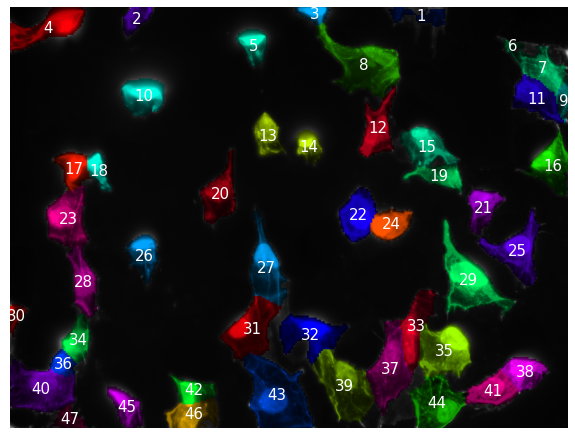

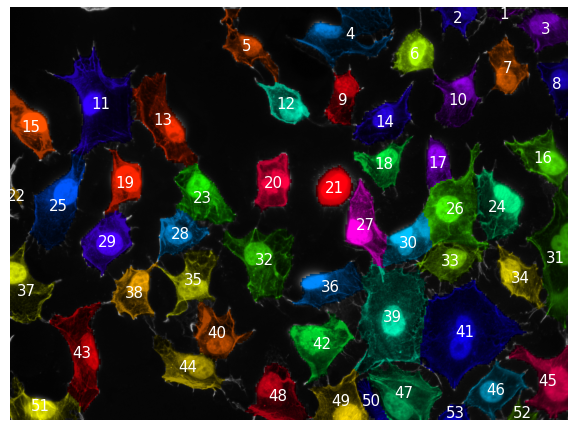

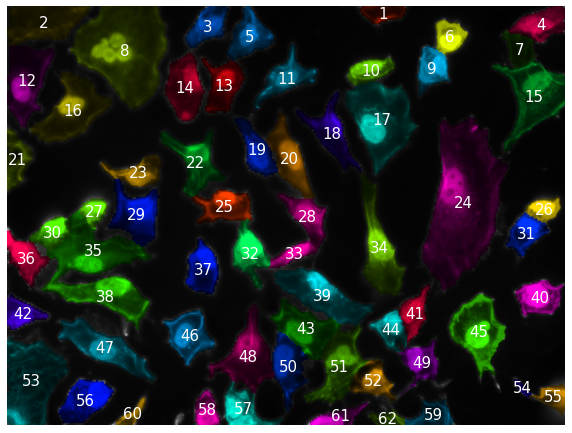

In [61]:
for idx, condition in enumerate(masks.keys()):
    mask = masks[condition]["cyto"]

    # Overlay mask on image
    mask_overlay = utils.mask_overlay(imgs[idx], mask)

    # Get centroid of mask
    props = measure.regionprops_table(mask, properties=["label", "centroid"])
    labels = props["label"]
    ys = props["centroid-0"]
    xs = props["centroid-1"]

    # Show contour
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(mask_overlay)
    ax.axis("off")
    for idx, (x, y) in enumerate(zip(xs, ys)):
        ax.annotate(
            labels[idx], (x, y), fontsize=15, c="white", ha="center", va="center"
        )

#     fig.savefig(str(condition)+'_mask_id.png', bbox_inches='tight', dpi=100)

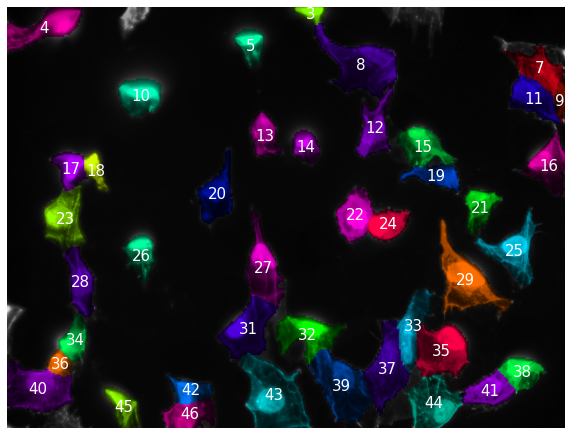

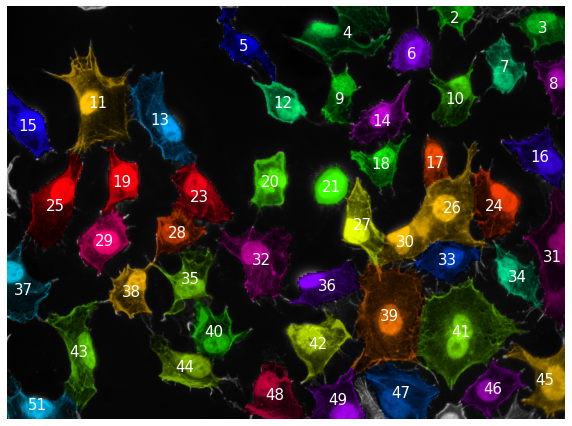

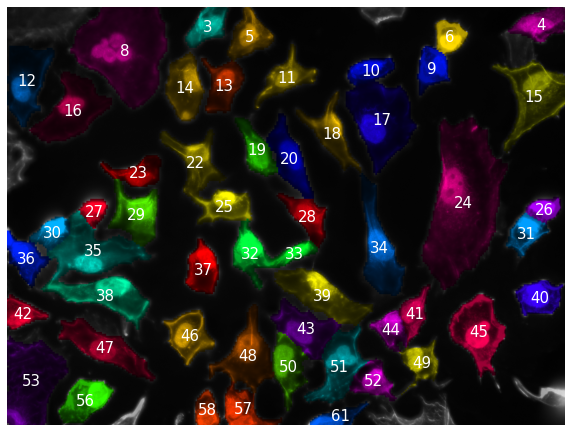

In [62]:
for idx, condition in enumerate(masks.keys()):
    cell_mask, _, _ = utils.qc_nuclei(
        masks[condition]["cyto"], masks[condition]["nuclei"]
    )

    # Overlay mask on image
    mask_overlay = utils.mask_overlay(imgs[idx], cell_mask)

    # Get centroid of mask
    props = measure.regionprops_table(cell_mask, properties=["label", "centroid"])
    labels = props["label"]
    ys = props["centroid-0"]
    xs = props["centroid-1"]

    # Show contour
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(mask_overlay)
    ax.axis("off")
    for idx, (x, y) in enumerate(zip(xs, ys)):
        ax.annotate(
            labels[idx], (x, y), fontsize=15, c="white", ha="center", va="center"
        )

#     fig.savefig(str(condition)+'_mask_id_qc.png', bbox_inches='tight', dpi=100)

# Mask with overlay

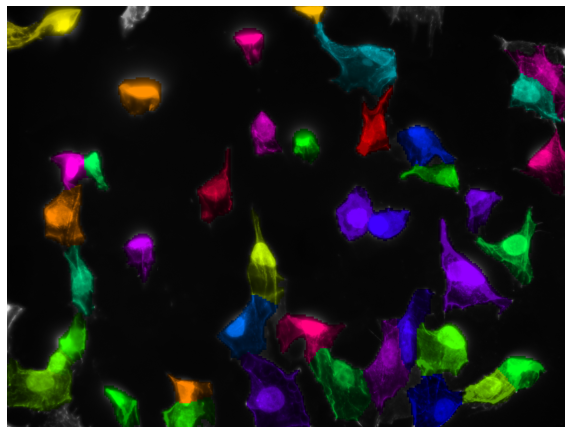

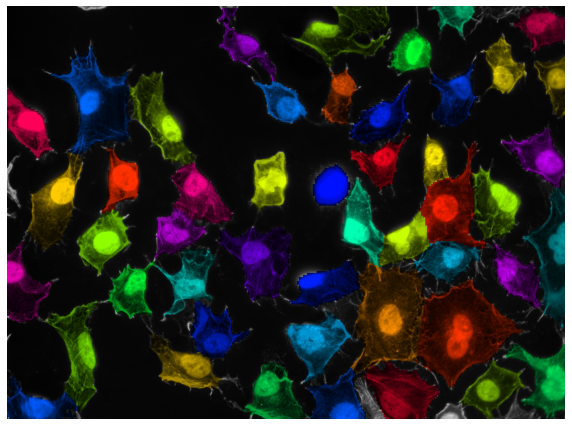

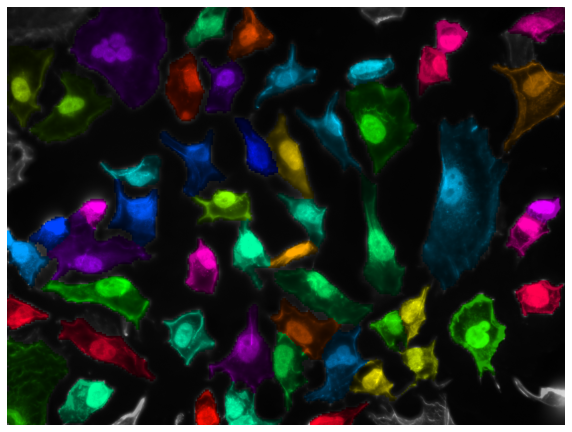

In [58]:
for idx, condition in enumerate(masks.keys()):
    cell_mask, _, _ = utils.qc_nuclei(
        masks[condition]["cyto"], masks[condition]["nuclei"]
    )

    # Overlay mask on image
    mask_overlay = utils.mask_overlay(imgs[idx], cell_mask)

    # Show contour
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(mask_overlay)
    ax.axis("off")
#     fig.savefig(str(condition)+'_cell_overlay.png', bbox_inches='tight', dpi=100)

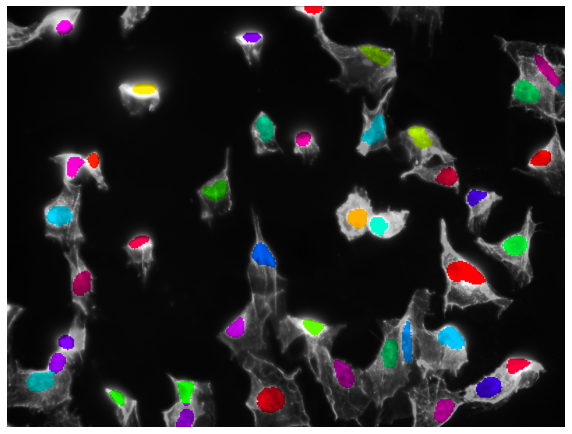

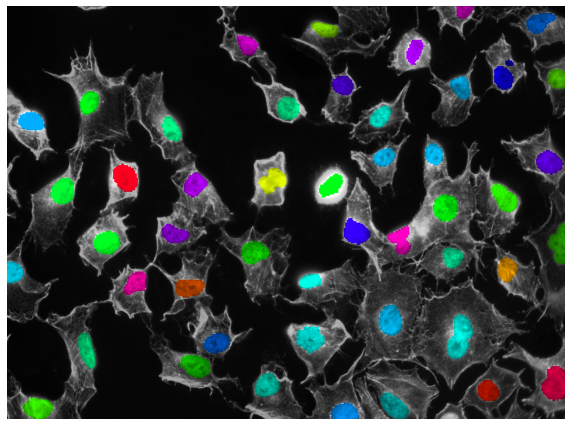

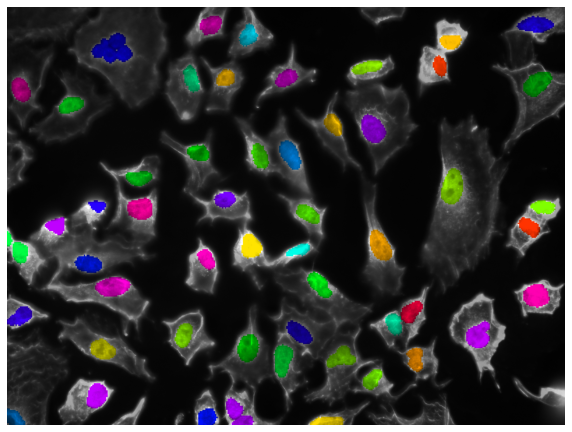

In [59]:
for idx, condition in enumerate(masks.keys()):
    _, nuclei_mask, _ = qc_nuclei(masks[condition]["cyto"], masks[condition]["nuclei"])

    # Overlay mask on image
    mask_overlay = utils.mask_overlay(imgs[idx], nuclei_mask)

    # Show contour
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(mask_overlay)
    ax.axis("off")
#     fig.savefig(str(condition)+'_nuclei_overlay.png', bbox_inches='tight', dpi=100)

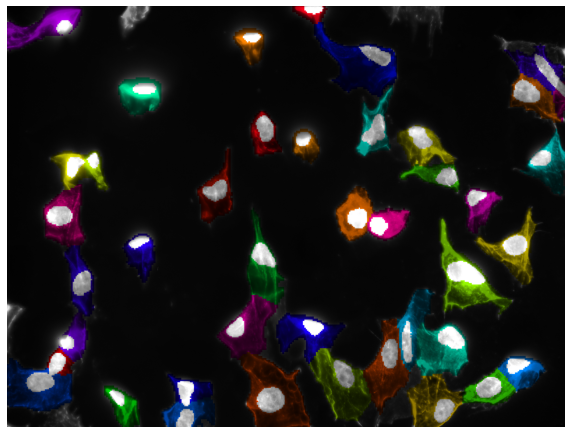

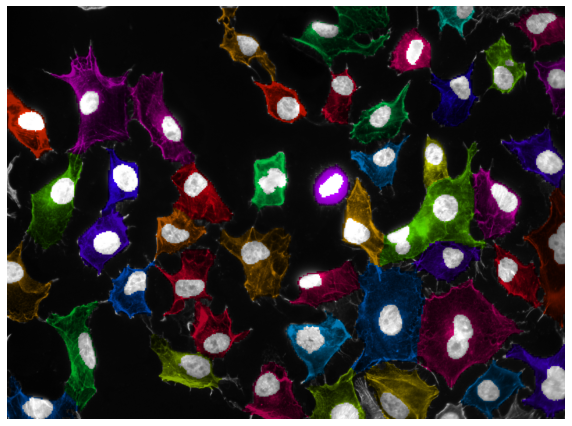

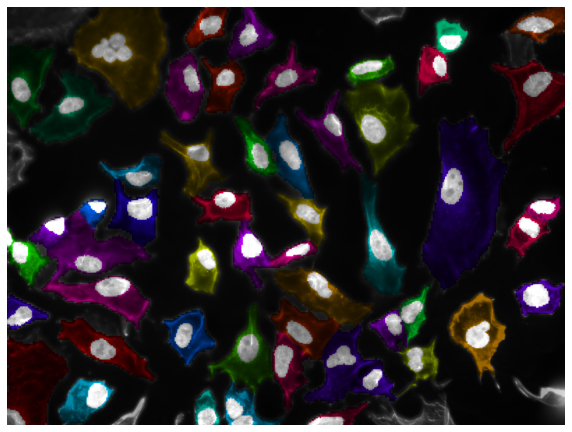

In [60]:
for idx, condition in enumerate(masks.keys()):
    _, _, cyto_mask = qc_nuclei(masks[condition]["cyto"], masks[condition]["nuclei"])

    # Overlay mask on image
    mask_overlay = utils.mask_overlay(imgs[idx], cyto_mask)

    # Show contour
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(mask_overlay)
    ax.axis("off")
#     fig.savefig(str(condition)+'_cyto_overlay.png', bbox_inches='tight', dpi=100)

# Show image

In [26]:
%matplotlib inline

In [ ]:
# Load contours
contours_all, contours_nuclei_all = utils.load_pickle(data_meta / "contours.pickle")

In [37]:
seg = ["Hoeschst", "Phalloidin", "WGA", "Concanavalin A"]
location = conditions[0]

df_subset = df[(df.Location == location)]
df_subset = df_subset[~df_subset.Marker.isin(seg)]

In [38]:
# Read images
data = []
markers = []
for row in df_subset.itertuples():
    img = skimage.io.imread(row.Path)
    p2, p98 = np.percentile(img, (1, 99))
    img = exposure.rescale_intensity(img, in_range=(p2, p98))
    mean = np.mean(img)
    img_rescale = cv2.subtract(img, np.ones(img.shape, dtype=img.dtype)*np.mean(img).astype(img.dtype))
    data.append(img_rescale)
    markers.append(row.Marker)
data = np.stack(data, axis=2)

# Extract max intensity
int_max = np.max(data, axis=(0, 1))
int_range = [[0, 0] for i in range(len(df_subset))]
for idx, level in enumerate(int_max):
    int_range[idx] = [0, level]
    

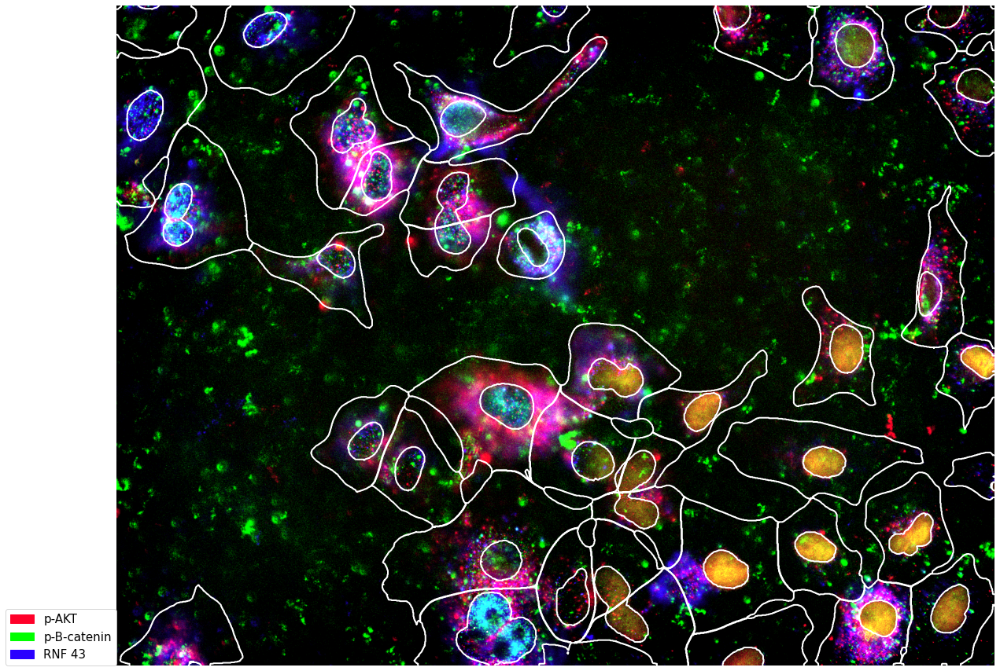

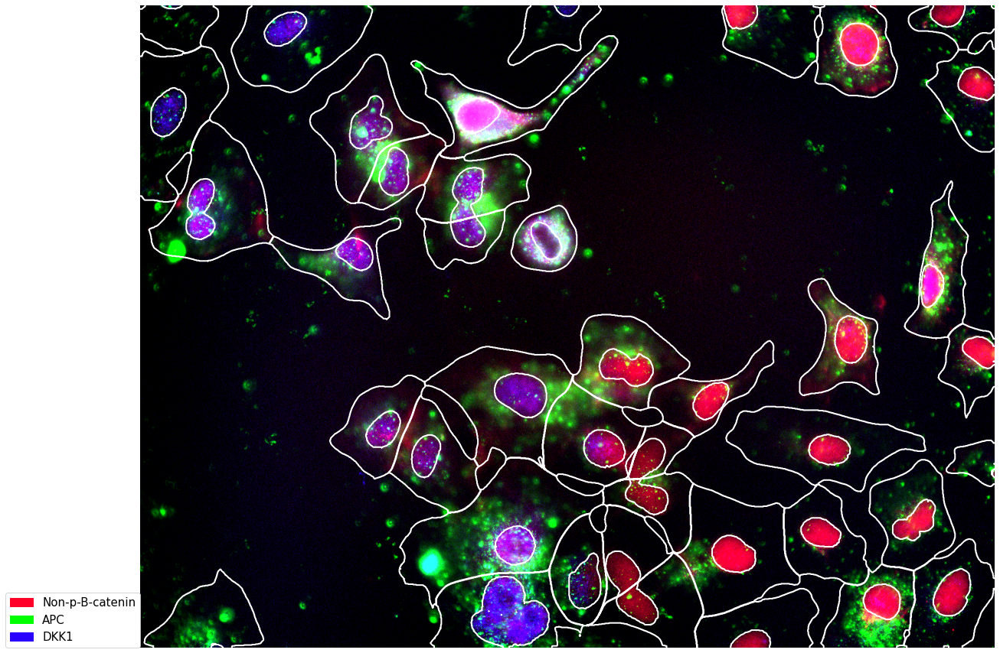

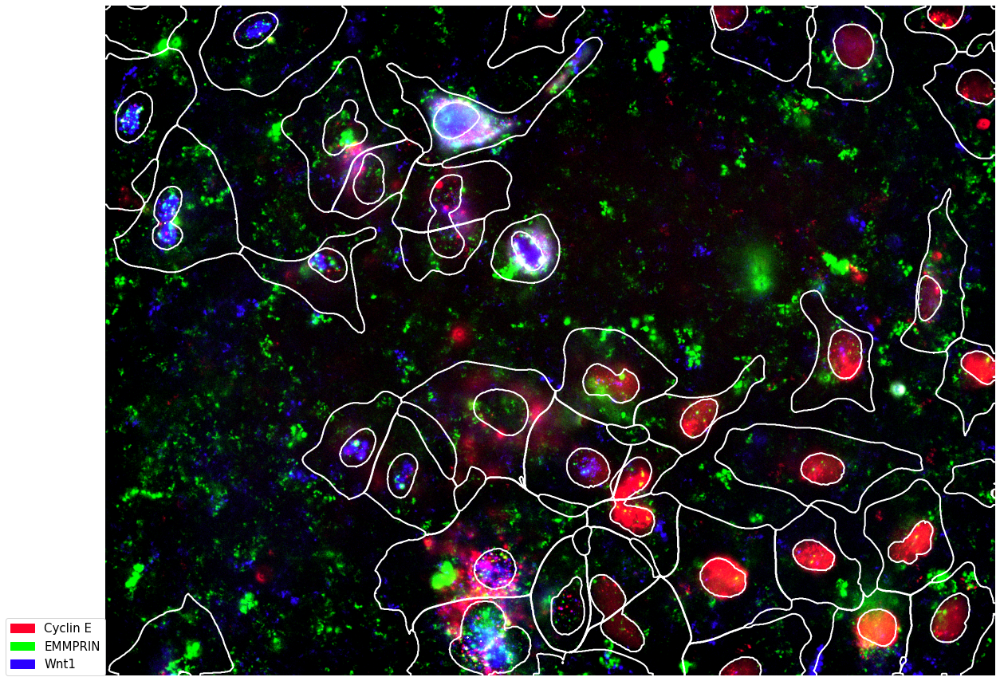

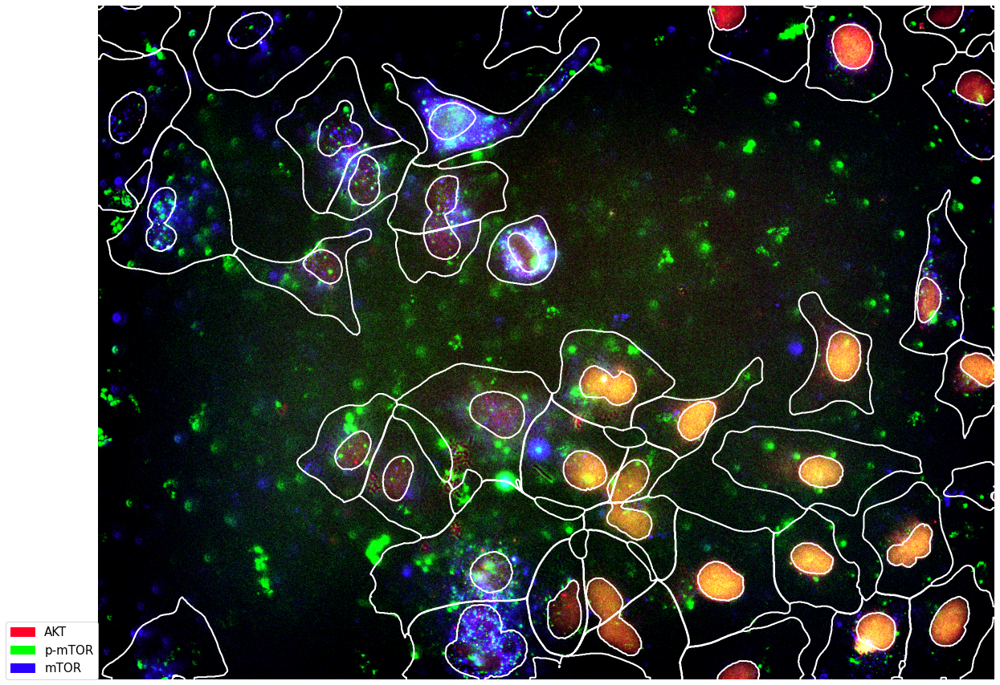

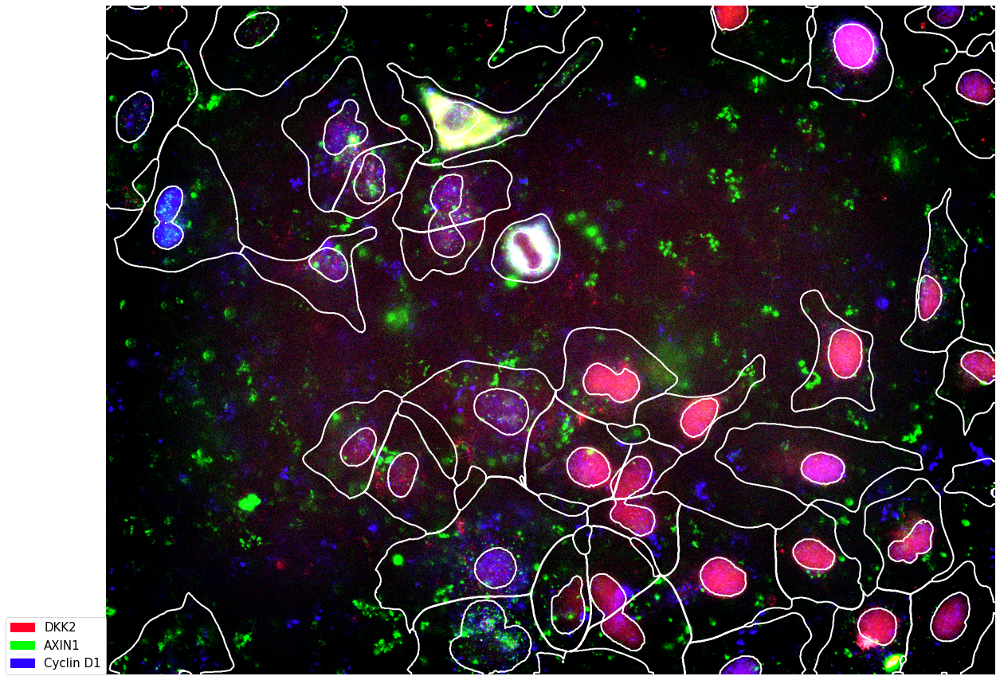

In [50]:
# Plot combined marker image 3 by 3 
n_group = 3
vals = np.linspace(0, 0.8, n_group)
my_color = plt.cm.gist_rainbow(vals)

for n in range(len(df_subset)//n_group):
    DEFAULT_CHANNELS = [n*3+i+1 for i in range(3)]
    RGB_MAP = {
        i: {"rgb": my_color[(i - 1) % 3][:3] * 255, "range": int_range[i - 1]}
        for i in DEFAULT_CHANNELS
    }
    
    fig, ax = plt.subplots(figsize=(20, 20))
    img = utils.convert_to_rgb(data, channels=DEFAULT_CHANNELS, rgb_map=RGB_MAP, vmax=255)
    ax.imshow(img)
    ax.axis("off")

    # plot contour
    utils.plot_contours(contours_all[str(condition)], ax)
    utils.plot_contours(contours_nuclei_all[str(condition)], ax)

    # Color legend
    patches = [
        mpatches.Patch(color=RGB_MAP[i]["rgb"] / 255.0, label=markers[i - 1])
        for i in DEFAULT_CHANNELS
    ]
    ax.legend(
        handles=patches,
        bbox_to_anchor=(0, 0),
        loc="lower right",
        borderaxespad=0.0,
        fontsize=15,
    )

    fig.savefig(figure_dir / 'expression' / f'{location}_{n}_multiplex_overlay.png', bbox_inches='tight', dpi=100)

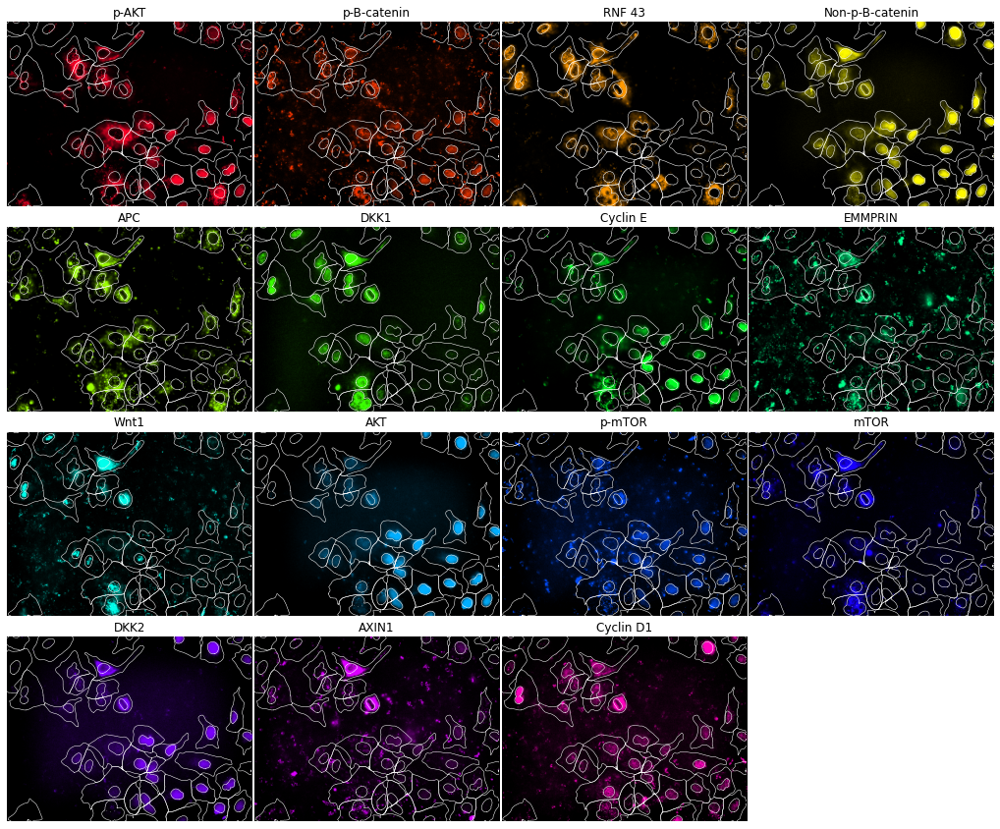

In [62]:
# Plot individual markers images
vals = np.linspace(0, 1, len(df_subset))
my_color = plt.cm.gist_rainbow(vals)

DEFAULT_CHANNELS = [i+1 for i in range(len(df_subset))]
RGB_MAP = {
    i: {"rgb": my_color[(i - 1)][:3] * 255, "range": int_range[i - 1]}
    for i in DEFAULT_CHANNELS
}

fig, axs = plt.subplots(4, 4, figsize=(18, 15))
axs = axs.flatten()
for i, ax in enumerate(axs):
    try:
        img = utils.one_channel(
            data[:, :, i][:, :, np.newaxis], i + 1, vmax=255, rgb_map=RGB_MAP
        )
        ax.imshow(img)
        ax.set_title(markers[i])
        # plot contour
        utils.plot_contours(contours_all[str(condition)], ax, linewidth=0.5)
        utils.plot_contours(contours_nuclei_all[str(condition)], ax, linewidth=0.5)
    except:
        pass
    ax.axis("off")
    ax.set_aspect("equal")
fig.subplots_adjust(wspace=0.01, hspace=0.1)
fig.savefig(figure_dir / 'expression' / f'{location}_all_markers.png', bbox_inches='tight', dpi=100)

In [69]:
%matplotlib agg

seg = ["Hoeschst", "Phalloidin", "WGA", "Concanavalin A"]

n_group = 3
vals = np.linspace(0, 0.8, n_group)
my_color_overlay = plt.cm.gist_rainbow(vals)

vals = np.linspace(0, 1, len(df_subset))
my_color = plt.cm.gist_rainbow(vals)
all_channels = [i+1 for i in range(15)]

for location in conditions:
    df_subset = df[(df.Location == location)]
    df_subset = df_subset[~df_subset.Marker.isin(seg)]
    
    # Read images
    data = []
    markers = []
    for row in df_subset.itertuples():
        img = skimage.io.imread(row.Path)
        p2, p98 = np.percentile(img, (1, 99))
        img = exposure.rescale_intensity(img, in_range=(p2, p98))
        mean = np.mean(img)
        img_rescale = cv2.subtract(img, np.ones(img.shape, dtype=img.dtype)*np.mean(img).astype(img.dtype))
        data.append(img_rescale)
        markers.append(row.Marker)
    data = np.stack(data, axis=2)

    # Extract max intensity
    int_max = np.max(data, axis=(0, 1))
    int_range = [[0, 0] for i in range(len(df_subset))]
    for idx, level in enumerate(int_max):
        int_range[idx] = [0, level]
    
    # Plot combined marker image 3 by 3 
    for n in range(len(df_subset)//n_group):
        DEFAULT_CHANNELS = [n*3+i+1 for i in range(3)]
        RGB_MAP = {
            i: {"rgb": my_color_overlay[(i - 1) % 3][:3] * 255, "range": int_range[i - 1]}
            for i in DEFAULT_CHANNELS
        }

        fig, ax = plt.subplots(figsize=(20, 20))
        img = utils.convert_to_rgb(data, channels=DEFAULT_CHANNELS, rgb_map=RGB_MAP, vmax=255)
        ax.imshow(img)
        ax.axis("off")

        # plot contour
        utils.plot_contours(contours_all[location], ax)
        utils.plot_contours(contours_nuclei_all[location], ax)

        # Color legend
        patches = [
            mpatches.Patch(color=RGB_MAP[i]["rgb"] / 255.0, label=markers[i - 1])
            for i in DEFAULT_CHANNELS
        ]
        ax.legend(
            handles=patches,
            bbox_to_anchor=(0, 0),
            loc="lower right",
            borderaxespad=0.0,
            fontsize=15,
        )

        fig.savefig(figure_dir / 'expression' / f'{location}_{n+1}_multiplex_overlay.png', bbox_inches='tight', dpi=100)
        
    # Plot individual markers images
    RGB_MAP = {
        i: {"rgb": my_color[(i - 1)][:3] * 255, "range": int_range[i - 1]}
        for i in all_channels
    }

    fig, axs = plt.subplots(4, 4, figsize=(18, 15))
    axs = axs.flatten()
    for i, ax in enumerate(axs):
        try:
            img = utils.one_channel(
                data[:, :, i][:, :, np.newaxis], i + 1, vmax=255, rgb_map=RGB_MAP
            )
            ax.imshow(img)
            ax.set_title(markers[i])
            # plot contour
            utils.plot_contours(contours_all[location], ax, linewidth=0.5)
            utils.plot_contours(contours_nuclei_all[location], ax, linewidth=0.5)
        except:
            pass
        ax.axis("off")
        ax.set_aspect("equal")
    fig.subplots_adjust(wspace=0.01, hspace=0.1)
    fig.savefig(figure_dir / 'expression' / f'{location}_all_markers.png', bbox_inches='tight', dpi=100)

<ipython-input-69-149862535b2f>:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(20, 20))
